In [1]:
import geopandas as gpd
import pandas as pd
import shapely
from shapely.geometry import Point, Polygon
import matplotlib.pyplot as plt
import contextily as ctx
import numpy as np
from scipy.stats import gaussian_kde
import seaborn as sns
from shapely.wkt import loads

In [5]:
# Load the data
df = pd.read_csv('data\df_util_distritos_2.csv')
df.columns.tolist()

['Unnamed: 0.2',
 'Unnamed: 0.1',
 'Unnamed: 0',
 'id_anuncio',
 'fecha',
 'precio',
 'precio_unitario_km2',
 'tipologia_imueble',
 'operacion',
 'area_construida',
 'n_habitaciones',
 'n_banos',
 'terraza',
 'ascensor',
 'aire_acondicionado',
 'amueblado',
 'parking',
 'parking_incluido_precio',
 'precio_parking',
 'orientacion_n',
 'orientacion_s',
 'orientacion_e',
 'orientacion_o',
 'trastero',
 'armarios',
 'piscina',
 'portero',
 'jardin',
 'duplex',
 'estudio',
 'arico',
 'ano_construccion',
 'n_piso',
 'exterior_interior',
 'cat_ano_construccion',
 'cat_n_max_pisos',
 'cat_n_vecinos',
 'cat_calidad',
 'nueva_construccion',
 'a_reformar',
 'buen_estado',
 'distancia_puerta_sol',
 'distancia_metro',
 'distancia_castellana',
 'longitud',
 'latitud',
 'ciudad',
 'geometry',
 'index_right',
 'LOCATIONID',
 'LOCATIONNAME',
 'WKT',
 'ZONELEVELID',
 'Distrito']

In [6]:


# Assuming the CSV has 'latitude' and 'longitude' columns for points,
# Remove the outlier
df = df[df['longitud'] < -2.8]
# and a 'polygon_wkt' column for polygon Well-Known Text (WKT) strings
df['geometry_points'] = df.apply(lambda row: Point(row['longitud'], row['latitud']), axis=1)
points_gdf = gpd.GeoDataFrame(df, geometry='geometry_points', crs='EPSG:4326')

# Convert polygons WKT to geometries and create a GeoDataFrame for polygons
# This part may need to be adjusted based on your actual data structure
df['geometry_polygons'] = df['WKT'].apply(lambda x: shapely.wkt.loads(x) if pd.notnull(x) else None)
polygons_gdf = gpd.GeoDataFrame(df.dropna(subset=['geometry_polygons']), geometry='geometry_polygons', crs='EPSG:4326')

# Reproject to Web Mercator
points_gdf = points_gdf.to_crs(epsg=3857)
polygons_gdf = polygons_gdf.to_crs(epsg=3857)

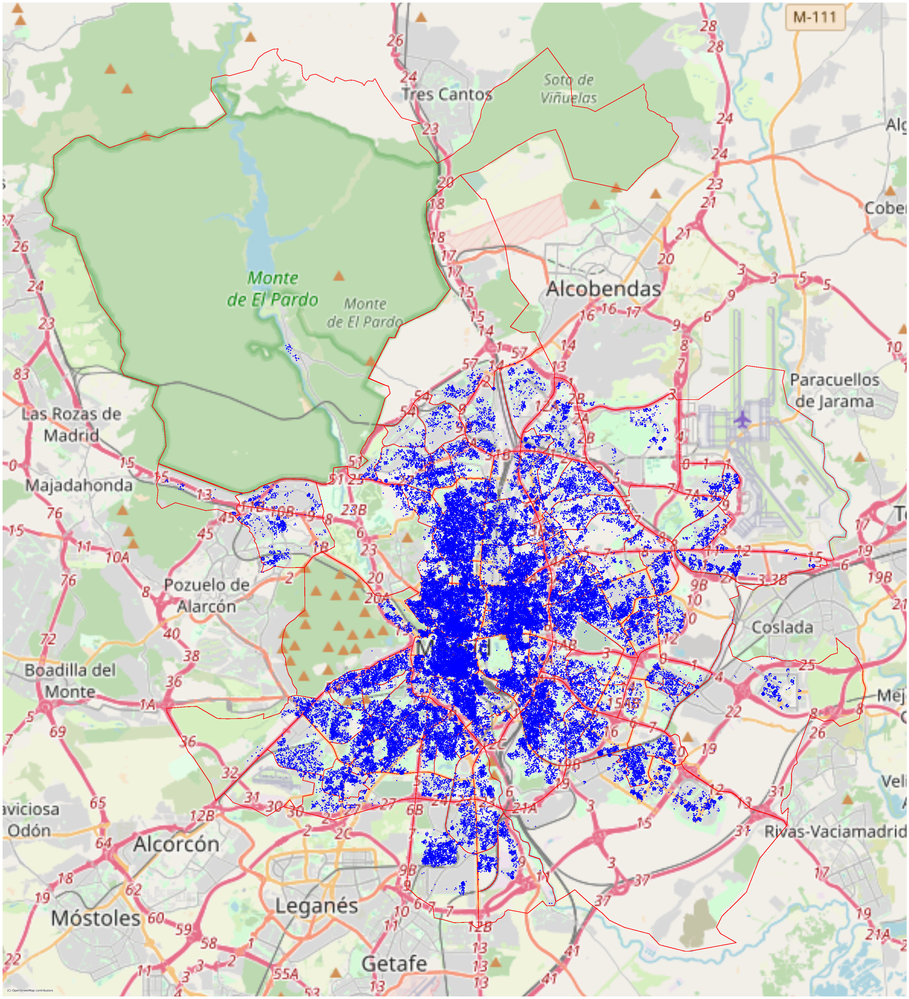

In [7]:
# Plotting
fig, ax = plt.subplots(figsize=(50, 50))
polygons_gdf.plot(ax=ax, facecolor='none', edgecolor='red')
points_gdf.plot(ax=ax, color='blue', marker='o', markersize=5)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
ax.set_axis_off()
plt.show()


In [ ]:
# Plotting
fig, ax = plt.subplots(figsize=(50, 50))
polygons_gdf.plot(ax=ax, alpha=0.5, edgecolor="black", facecolor="none")  # Change color to black for clearer contrast
points_gdf.plot(ax=ax, alpha = 0.1, color="red", marker='$\\bigtriangledown$')  # Change marker color to black

# Adding a grayscale basemap
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=points_gdf.crs.to_string())

ax.set_axis_off()
plt.tight_layout()
plt.show()


In [ ]:
ax.figure.savefig('./plots/plot1.png', bbox_inches='tight')

In [ ]:
points_gdf = points_gdf.to_crs(epsg=3857)
polygons_gdf = polygons_gdf.to_crs(epsg=3857)

In [ ]:

# Extract x and y coordinates of points
xy = np.vstack([points_gdf.geometry.x, points_gdf.geometry.y])
# Calculate KDE
z = gaussian_kde(xy)(xy)


In [ ]:
# Plotting
fig, ax1 = plt.subplots(figsize=(50, 50))

# Plot polygons with specified style
polygons_gdf.plot(ax=ax1, alpha=0.5, edgecolor="black", facecolor="none")

# Calculate density for points if not already done
# Assuming 'z' is the density array calculated from your previous step
points_gdf['density'] = z

# Add KDE density plot for points
points_density = ax1.scatter(
                    points_gdf.geometry.x,
                    points_gdf.geometry.y,
                    c=points_gdf['density'],
                    s=20,  # Adjust size as needed
                    alpha=0.7,
                    zorder=3,
                    cmap='viridis'  # Color map
                    )

# Adding a grayscale basemap
ctx.add_basemap(ax1, source=ctx.providers.CartoDB.Positron, crs=points_gdf.crs.to_string())

ax1.set_axis_off()
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
# Save the figure
ax1.figure.savefig('./plots/plot_KDE.png', bbox_inches='tight')


In [ ]:
# Reproject to Web Mercator (EPSG:3857) for consistency with the contextily basemap
points_gdf = points_gdf.to_crs(epsg=3857)
polygons_gdf = polygons_gdf.to_crs(epsg=3857)

In [ ]:
# Reproject to Web Mercator (EPSG:3857) for consistency with the contextily basemap
points_gdf = points_gdf.to_crs(epsg=3857)
polygons_gdf = polygons_gdf.to_crs(epsg=3857)

# Creating a large figure
fig, ax = plt.subplots(figsize=(50, 50))

# Extract x and y coordinates after reprojection
x = points_gdf.geometry.x
y = points_gdf.geometry.y

# Plot KDE of the geometry coordinates using seaborn
density_plot = sns.kdeplot(
    x=x,
    y=y,
    shade=True,  # Fill the contour
    alpha=0.5,  # Transparency of the fill
    cmap="viridis",  # Color map
    shade_lowest=False,  # Avoid shading the lowest density region
    zorder=2,  # Ensure the KDE plot is below the polygons
    ax=ax  # Plot on the created axes object
)

# Plot polygons
polygons_gdf.plot(ax=ax, alpha=0.5, edgecolor="black", facecolor="none", zorder=3)

# Adding a grayscale basemap
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs='EPSG:3857')

ax.set_axis_off()
plt.tight_layout()

In [ ]:
# Save the figure
ax.figure.savefig('./plots/plot_KDE_sns.png', bbox_inches='tight')

In [ ]:
# Visualización
fig, ax = plt.subplots(figsize=(50, 50))  # Un tamaño considerablemente grande

# Usar el precio para determinar el color de cada punto
points_gdf.plot(ax=ax, column='precio', cmap='viridis', legend=True,
                legend_kwds={'label': "Precio de los anuncios", 'orientation': "vertical"})

# Plot polygons
polygons_gdf.plot(ax=ax, alpha=0.5, edgecolor="black", facecolor="none", zorder=3)

# Añadiendo un mapa base en escala de grises
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=points_gdf.crs.to_string())

ax.set_axis_off()
plt.tight_layout()

# Ajustar la leyenda después de haber sido creada (adaptando según lo necesario)
leg = ax.get_legend()
if leg:
    leg.set_bbox_to_anchor((1.05, 1))
    leg.set_title("Precio de los anuncios", prop={'size': 10})  # Ajusta el tamaño del título de la leyenda

# Si es necesario, ajusta el tamaño de los elementos de la leyenda (no directamente soportado aquí, podría requerir manipulación adicional)

# Mostrar el gráfico
plt.show()


# Guardar la figura
fig.savefig('./plots/plot_prices_madrid.png', bbox_inches='tight')

In [ ]:
# Removiendo outliers de 'precio' usando el método IQR
Q1 = df['precio'].quantile(0.25)
Q3 = df['precio'].quantile(0.75)
IQR = Q3 - Q1
filtro = (df['precio'] >= Q1 - 1.5 * IQR) & (df['precio'] <= Q3 + 1.5 * IQR)
df_filtrado = df[filtro]

# Creando GeoDataFrame para puntos
df_filtrado['geometry_points'] = df_filtrado.apply(lambda row: Point(row['longitud'], row['latitud']), axis=1)
points_gdf = gpd.GeoDataFrame(df_filtrado, geometry='geometry_points', crs='EPSG:4326')

# Reproyectando a Web Mercator
points_gdf = points_gdf.to_crs(epsg=3857)

# Visualización
fig, ax = plt.subplots(figsize=(50, 50))  # Ajusta el tamaño según necesites

# Visualizando los puntos ajustando el color por precio
points_gdf.plot(ax=ax, column='precio', cmap='viridis', legend=True,
                legend_kwds={'label': "Precio de los anuncios", 'orientation': "vertical"})

# Plot polygons
polygons_gdf.plot(ax=ax, alpha=0.5, edgecolor="black", facecolor="none", zorder=3)
# Añadiendo un mapa base en escala de grises
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=points_gdf.crs.to_string())

# Ajustar manualmente la leyenda después de haber sido creada
leg = ax.get_legend()
if leg:
    leg.set_bbox_to_anchor((1.05, 1))
    leg.set_title("Precio de los anuncios", prop={'size': 10})

ax.set_axis_off()
plt.tight_layout()

# Mostrar el gráfico
plt.show()

# Guardar la figura
fig.savefig('./plots/plot_prices_madrid_filtered_legend_corrected.png', bbox_inches='tight')

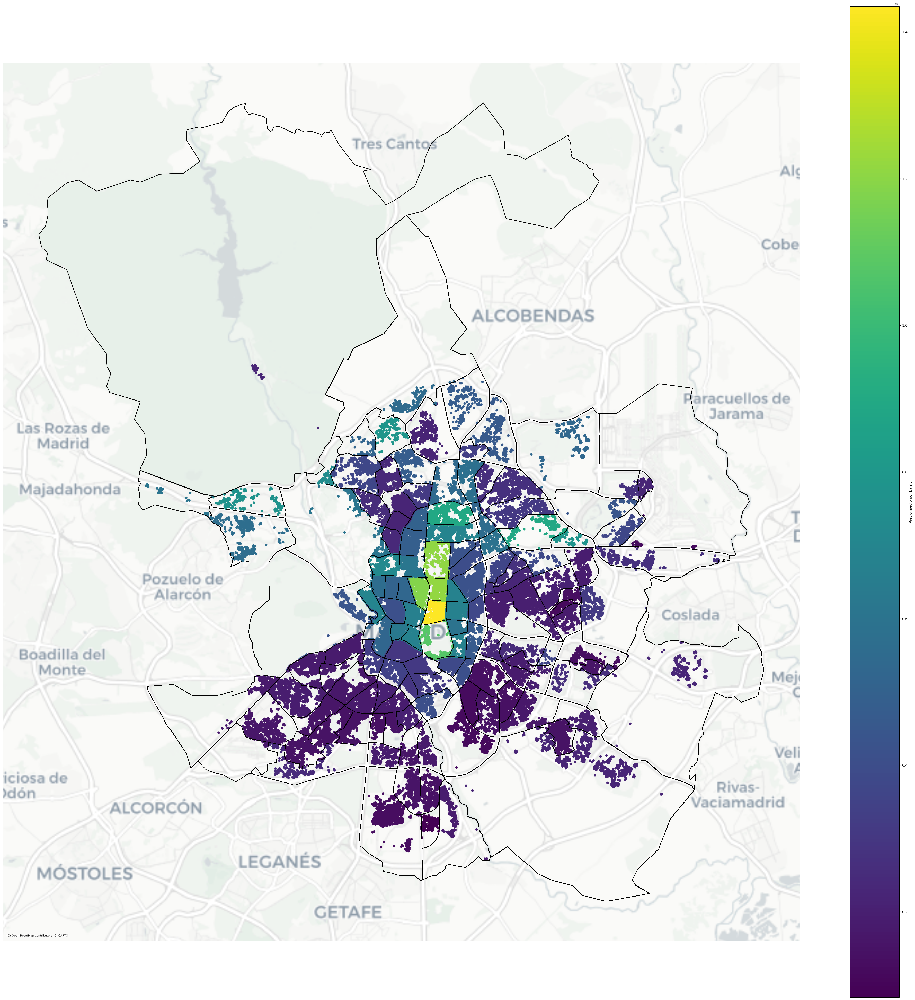

In [9]:
# Load the data
df = pd.read_csv('data\df_util_distritos_2.csv')

# Assuming the CSV has 'latitude' and 'longitude' columns for points,
# Remove the outlier
df = df[df['longitud'] < -2.8]


# Suponiendo que df ya contiene 'latitud' y 'longitud'
df['geometry'] = gpd.points_from_xy(df['longitud'], df['latitud'])
gdf = gpd.GeoDataFrame(df, geometry='geometry', crs='EPSG:4326')

# Ahora, suponiendo que deseas visualizar el precio medio por barrio
# Primero, calculamos el precio medio por barrio
precios_por_barrio = gdf.groupby('LOCATIONNAME')['precio'].mean().reset_index()

# Luego, unimos estos precios medios de vuelta al GeoDataFrame original
# Nota: Este paso puede necesitar ajustes si tu situación de datos es diferente
gdf = gdf.merge(precios_por_barrio, on='LOCATIONNAME', suffixes=('', '_mean'))

# Convertimos a Web Mercator para alinear con las capas base de contextily
gdf = gdf.to_crs(epsg=3857)

# Visualización
fig, ax = plt.subplots(figsize=(50, 50))

# Aquí usamos 'precio_mean' para el color, asegúrate de que este campo exista en tu DataFrame
gdf.plot(ax=ax, column='precio_mean', cmap='viridis', legend=True,
         legend_kwds={'label': "Precio medio por barrio", 'orientation': "vertical"})

# Plot polygons
polygons_gdf.plot(ax=ax, alpha=0.5, edgecolor="black", facecolor="none", zorder=3)
# Añadiendo un mapa base
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

ax.set_axis_off()
plt.show()

# Guardar la figura
#fig.savefig('./plots/plot_prices_madrid_media_por_barrio.png', bbox_inches='tight')

In [10]:
# Asegurarse de que solo se procesen cadenas válidas en la columna 'WKT'
df = df.dropna(subset=['WKT'])  # Eliminar filas donde 'WKT' es NaN
df['geometry_polygons'] = df['WKT'].apply(lambda x: loads(x) if isinstance(x, str) else None)

# Convertir la columna WKT de polígonos a geometrías
df['geometry_polygons'] = df['WKT'].apply(lambda x: loads(x))
polygons_gdf = gpd.GeoDataFrame(df, geometry='geometry_polygons', crs='EPSG:4326')

# Convertir puntos a geometrías
df['geometry_points'] = gpd.points_from_xy(df['longitud'], df['latitud'])
points_gdf = gpd.GeoDataFrame(df, geometry='geometry_points', crs='EPSG:4326')

# Obtener lista única de barrios
barrios_unicos = df['Distrito'].unique()

# Iterar sobre cada barrio
for barrio in barrios_unicos:
    # Filtrar polígonos y puntos para el barrio actual
    poligono = polygons_gdf[polygons_gdf['LOCATIONNAME'] == barrio]
    puntos = points_gdf[points_gdf['LOCATIONNAME'] == barrio]

    # Verificar si hay datos para el barrio
    if not poligono.empty and not puntos.empty:
        # Visualización
        fig, ax = plt.subplots(figsize=(10, 10))
        # Convertir a Web Mercator
        poligono = poligono.to_crs(epsg=3857)
        puntos = puntos.to_crs(epsg=3857)
        # Dibujar polígono del barrio
        poligono.plot(ax=ax, alpha=0.5, edgecolor="black", facecolor="none", zorder=3)
        # Dibujar puntos de los anuncios
        puntos.plot(ax=ax, column='precio_unitario_km2', cmap='viridis', legend=True, 
                    legend_kwds={'label': "Precio", 'orientation': "vertical"})
        ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
        ax.set_title(f"Distribución de precios en {barrio}")
        ax.set_axis_off()
        plt.tight_layout()
        plt.show()

        # Guardar el plot
        fig.savefig(f'plots/barrios/{barrio}.png', bbox_inches='tight')

In [ ]:
def plot_outliers_filtered_columns(df, numeric_columns, polygons_gdf):
    for column in numeric_columns:
        # Removiendo outliers usando el método IQR
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        filtro = (df[column] >= Q1 - 1.5 * IQR) & (df[column] <= Q3 + 1.5 * IQR)
        df_filtrado = df[filtro].copy()

        # Creando GeoDataFrame para puntos
        df_filtrado['geometry_points'] = df_filtrado.apply(lambda row: Point(row['longitud'], row['latitud']), axis=1)
        points_gdf = gpd.GeoDataFrame(df_filtrado, geometry='geometry_points', crs='EPSG:4326')

        # Reproyectando a Web Mercator
        points_gdf = points_gdf.to_crs(epsg=3857)

        # Visualización
        fig, ax = plt.subplots(figsize=(50, 50))  # Ajusta el tamaño según necesites

        # Visualizando los puntos ajustando el color por la columna actual
        points_gdf.plot(ax=ax, column=column, cmap='viridis', legend=True,
                        legend_kwds={'label': f"Valor de {column}", 'orientation': "vertical"})

        # Plot polygons
        polygons_gdf.plot(ax=ax, alpha=0.5, edgecolor="black", facecolor="none", zorder=3)
        # Añadiendo un mapa base en escala de grises
        ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=points_gdf.crs.to_string())

        # Ajustar manualmente la leyenda después de haber sido creada
        leg = ax.get_legend()
        if leg:
            leg.set_bbox_to_anchor((1.05, 1))
            leg.set_title(f"Valor de {column}", prop={'size': 10})
        
        ax.set_title(f"Distribución de {column} sin outlier")

        ax.set_axis_off()
        plt.tight_layout()

        # Mostrar el gráfico
        plt.show()

        # Guardar la figura
        fig.savefig(f'./plots/Features/plot_{column}_sin_outliers.png', bbox_inches='tight')

# Uso de la función
# Supongamos que df es tu DataFrame y 'precio' es una de las columnas numéricas, junto con otras que desees incluir.
numeric_columns = ['precio',
 'precio_unitario_km2',
 'area_construida',
 'n_habitaciones',
 'n_banos',
 'terraza',
 'ascensor',
 'aire_acondicionado',
 'amueblado',
 'parking',
 'parking_incluido_precio',
 'precio_parking',
 'orientacion_n',
 'orientacion_s',
 'orientacion_e',
 'orientacion_o',
 'trastero',
 'armarios',
 'piscina',
 'portero',
 'jardin',
 'duplex',
 'estudio',
 'arico',
 'ano_construccion',
 'n_piso',
 'exterior_interior',
 'cat_ano_construccion',
 'cat_n_max_pisos',
 'cat_n_vecinos',
 'cat_calidad',
 'nueva_construccion',
 'a_reformar',
 'buen_estado',
 'distancia_puerta_sol',
 'distancia_metro',
 'distancia_castellana']  # Aquí, reemplaza y añade las columnas que deseas procesar
# Asegúrate de tener 'polygons_gdf' definido como tu GeoDataFrame de polígonos antes de llamar a la función.
plot_outliers_filtered_columns(df, numeric_columns, polygons_gdf)